# Exploring the Data

In [1]:
%matplotlib inline
import os
import numpy as np
import matplotlib
import mne
from pathlib import Path

# Loading data
speech_decoding_dir = "/rds/homes/t/txr124/parkh-speech-decode3/MSc_2025_26/Thomas_Roberts/speech_decoding/data/raw"
single_run_ses02 = os.path.join(speech_decoding_dir, 'sub-01', 'ses-02', 'meg', 'sub-01_ses-02_task-imaginedSpeech_run-01_meg.fif')


SUBJECTS_DIR = os.path.join(speech_decoding_dir, 'sub-01', 'anat')

data_root = Path("/rds/homes/t/txr124/parkh-speech-decode3/MSc_2025_26/Thomas_Roberts/speech_decoding/data")
subject_id = 'sub-01'
derivatives_dir = data_root / 'derivatives' / 'preprocessing' / subject_id / 'meg'
derivatives_dir.mkdir(parents=True, exist_ok=True)

raw = mne.io.read_raw_fif(single_run_ses02)


Opening raw data file /rds/homes/t/txr124/parkh-speech-decode3/MSc_2025_26/Thomas_Roberts/speech_decoding/data/raw/sub-01/ses-02/meg/sub-01_ses-02_task-imaginedSpeech_run-01_meg.fif...
    Read a total of 8 projection items:
        generated with autossp-1.2.0 (1 x 306)  idle
        generated with autossp-1.2.0 (1 x 306)  idle
        generated with autossp-1.2.0 (1 x 306)  idle
        generated with autossp-1.2.0 (1 x 306)  idle
        generated with autossp-1.2.0 (1 x 306)  idle
        generated with autossp-1.2.0 (1 x 306)  idle
        generated with autossp-1.2.0 (1 x 306)  idle
        generated with autossp-1.2.0 (1 x 306)  idle
    Range : 124000 ... 867999 =    124.000 ...   867.999 secs
Ready.


## Rejecting Bads

In [2]:
print(raw.info["bads"])

[]


In [3]:
# Finding bad channels
fine_cal_file = os.path.join(speech_decoding_dir, 'SSS', 'sss_cal_mgh.dat')
ct_file = os.path.join(speech_decoding_dir, 'SSS', 'ct_sparse_mgh.fif')

auto_noisy_ch, auto_flat_ch, auto_scores = mne.preprocessing.find_bad_channels_maxwell(raw, cross_talk = ct_file, calibration = fine_cal_file, return_scores = True)

bad_channels = auto_noisy_ch + auto_flat_ch
raw.info["bads"].extend(bad_channels)

print(raw.info["bads"])


Applying low-pass filter with 40.0 Hz cutoff frequency ...
Reading 0 ... 743999  =      0.000 ...   743.999 secs...
Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 331 samples (0.331 s)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 306 out of 306 | elapsed:    4.7s finished


Scanning for bad channels in 148 intervals (5.0 s) ...
102 of 102 magnetometer types replaced with T3.
    No bad MEG channels
    Processing 204 gradiometers and 102 magnetometers
    Using fine calibration sss_cal_mgh.dat
        Adjusting non-orthogonal EX and EY
        Adjusted coil positions by (μ ± σ): 0.3° ± 0.3° (max: 1.7°)
    Automatic origin fit: head of radius 97.4 mm
    Using origin 2.4, 11.2, 19.7 mm in the head frame
        Interval   1:    0.000 -    4.999
        Interval   2:    5.000 -    9.999
        Interval   3:   10.000 -   14.999
        Interval   4:   15.000 -   19.999
        Interval   5:   20.000 -   24.999
        Interval   6:   25.000 -   29.999
        Interval   7:   30.000 -   34.999
        Interval   8:   35.000 -   39.999
        Interval   9:   40.000 -   44.999
        Interval  10:   45.000 -   49.999
        Interval  11:   50.000 -   54.999
        Interval  12:   55.000 -   59.999
        Interval  13:   60.000 -   64.999
        Interval

Using matplotlib as 2D backend.


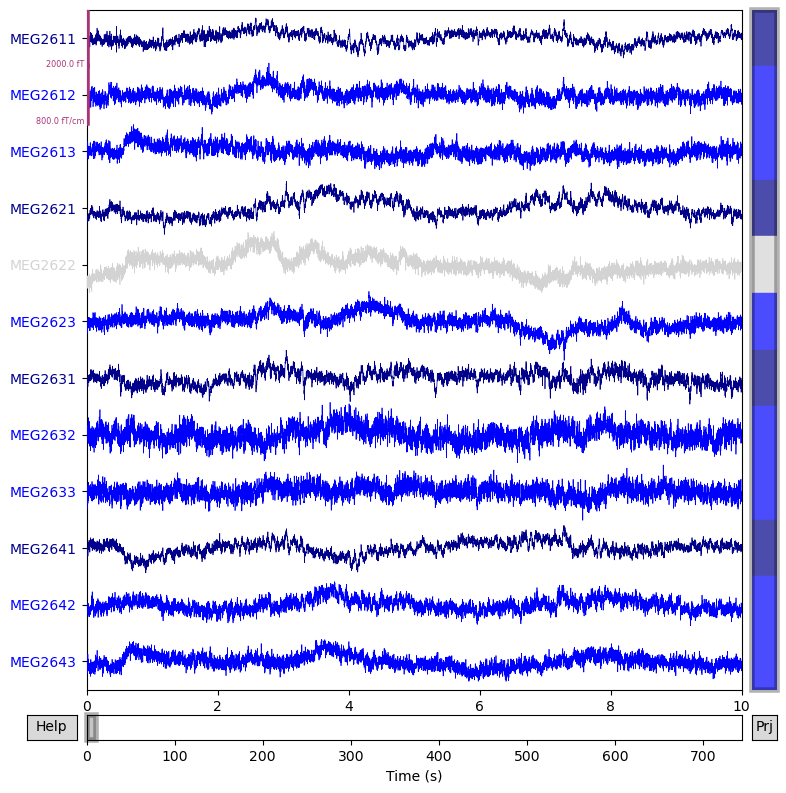

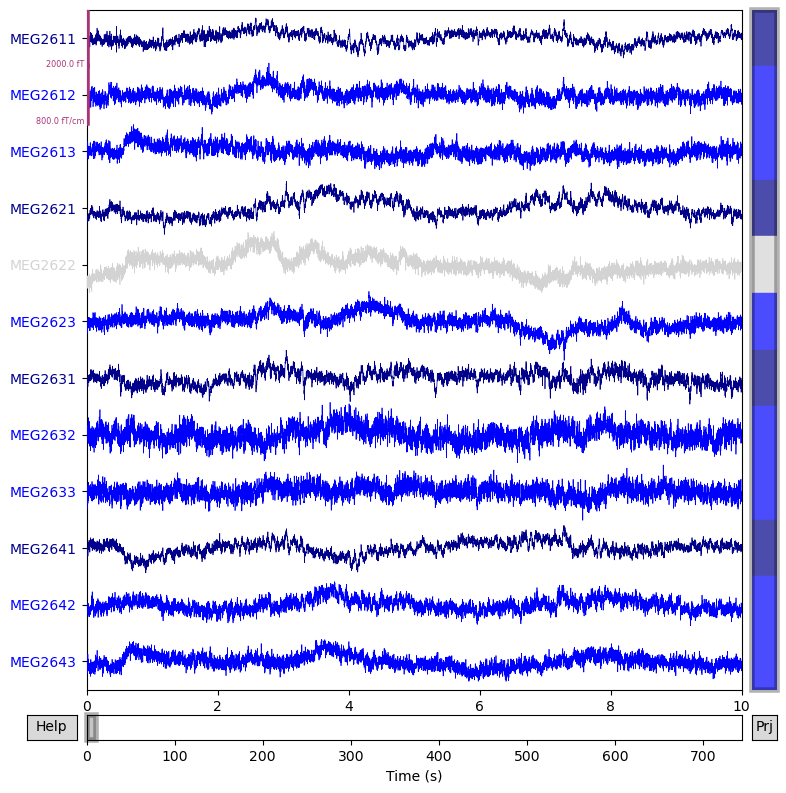

In [4]:
picks = mne.pick_channels_regexp(raw.ch_names, regexp="MEG26..")
raw.plot(order=picks, n_channels=len(picks))

In [5]:
eog_events = mne.preprocessing.find_eog_events(raw)

Using EOG channels: EOG001, EOG002
EOG channel index for this subject is: [0 1]
Filtering the data to remove DC offset to help distinguish blinks from saccades
Selecting channel EOG002 for blink detection
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 s)

Now detecting blinks and generating corresponding events
Found 177 significant peaks
Number of EOG events detected: 177


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


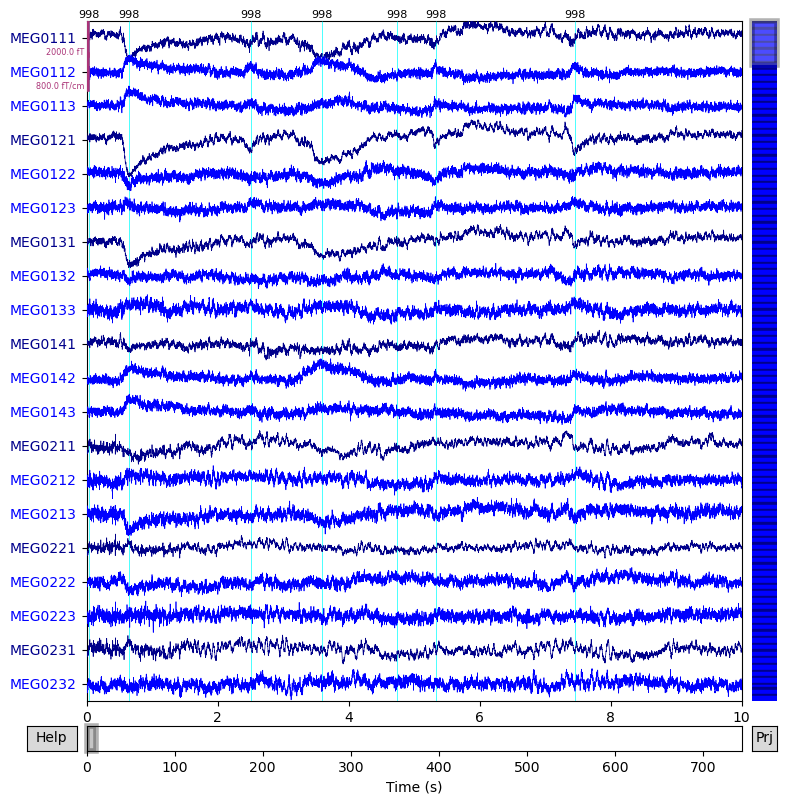

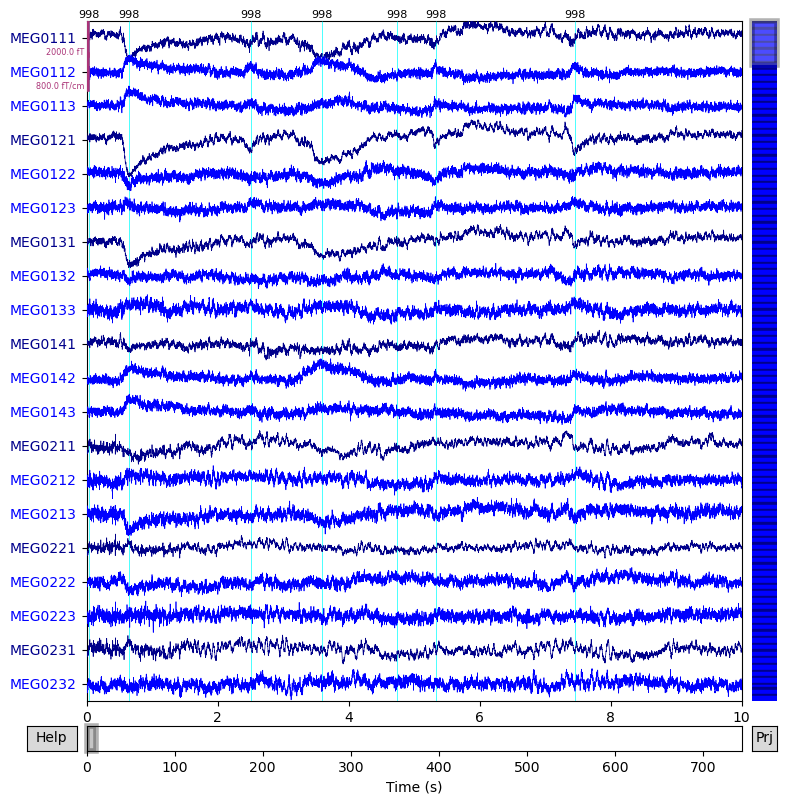

In [6]:
meg_picks = mne.pick_types(raw.info, meg=True, eeg=False)
raw.plot(events=eog_events, order=meg_picks)

## Filtering

In [7]:
raw.load_data()

# Filtering data 
# Variables
sampling_freq = 250
low_frequency = 1
high_frequency = 40
notch_freq = (50, 100)

filtered_data = raw.copy().filter(l_freq = low_frequency, h_freq = high_frequency)
notch_filtered_data = filtered_data.notch_filter(freqs=notch_freq)
sampled_data = notch_filtered_data.resample(sfreq = sampling_freq)
print("filtered: Sf = 250hz, high-pass = 0.5hz, low-pass 40hz")

Reading 0 ... 743999  =      0.000 ...   743.999 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 3301 samples (3.301 s)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 306 out of 306 | elapsed:    5.1s finished


Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 6601 samples (6.601 s)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 306 out of 306 | elapsed:    5.6s finished


305 events found on stim channel STI101
Event IDs: [   1    2    4    8 4864 4865 4873]
305 events found on stim channel STI101
Event IDs: [   1    2    4    8 4864 4865 4873]
filtered: Sf = 250hz, high-pass = 0.5hz, low-pass 40hz


## Artifact Reparing

In [8]:
# Apply SSS

raw_sss = mne.preprocessing.maxwell_filter(sampled_data, cross_talk = ct_file, calibration = fine_cal_file)

Maxwell filtering raw data
102 of 102 magnetometer types replaced with T3.
    Bad MEG channels being reconstructed: ['MEG2622']
    Processing 204 gradiometers and 102 magnetometers
    Using fine calibration sss_cal_mgh.dat
        Adjusting non-orthogonal EX and EY
        Adjusted coil positions by (μ ± σ): 0.3° ± 0.3° (max: 1.7°)
    Automatic origin fit: head of radius 97.4 mm
    Using origin 2.4, 11.2, 19.7 mm in the head frame
        Using 85/95 harmonic components for    0.000  (70/80 in, 15/15 out)
    Using loaded raw data
    Processing 74 data chunks
[done]


In [9]:
# ICA

ica = mne.preprocessing.ICA(n_components=0.999, method="picard", random_state=42, max_iter="auto")

ica_data = ica.fit(raw_sss)

Fitting ICA to data using 306 channels (please be patient, this may take a while)
Selecting by explained variance: 68 components
Fitting ICA took 180.5s.


Creating RawArray with float64 data, n_channels=71, n_times=186000
    Range : 31000 ... 216999 =    124.000 ...   867.996 secs
Ready.


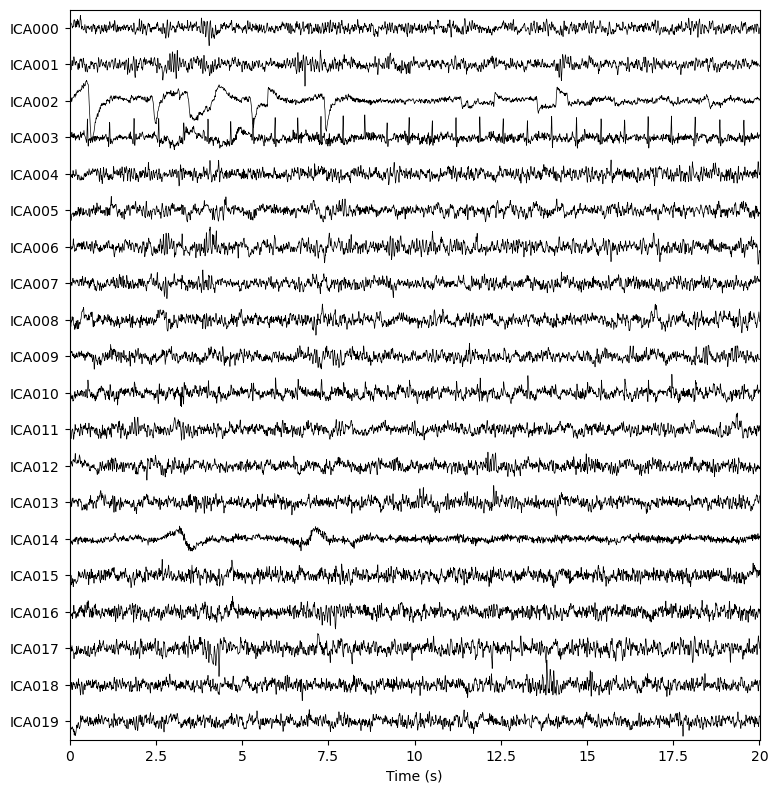

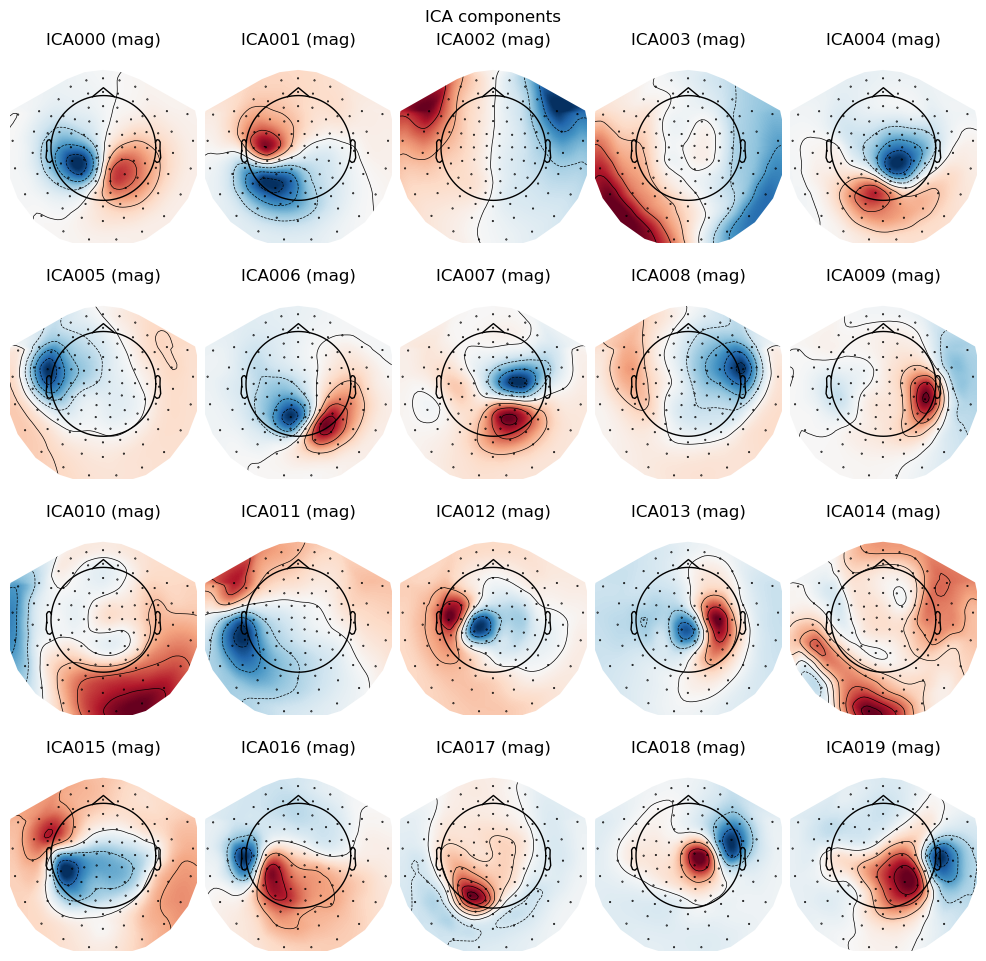

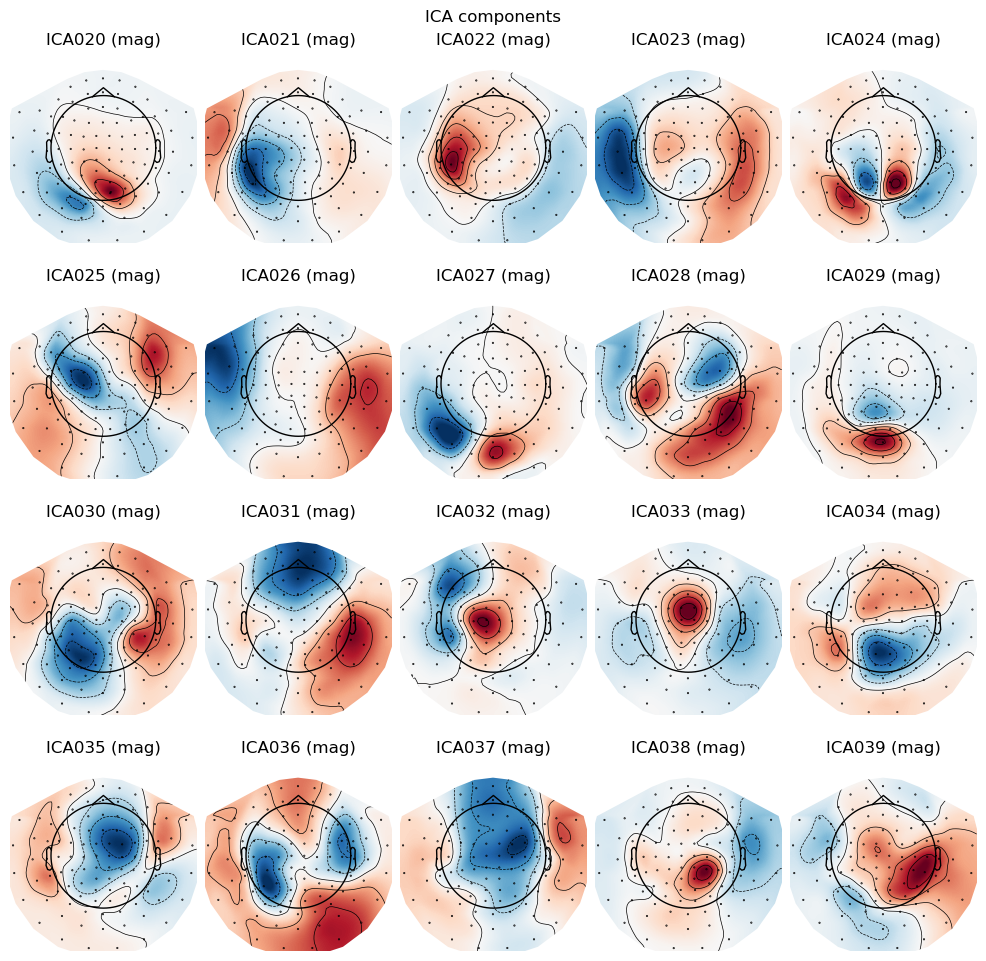

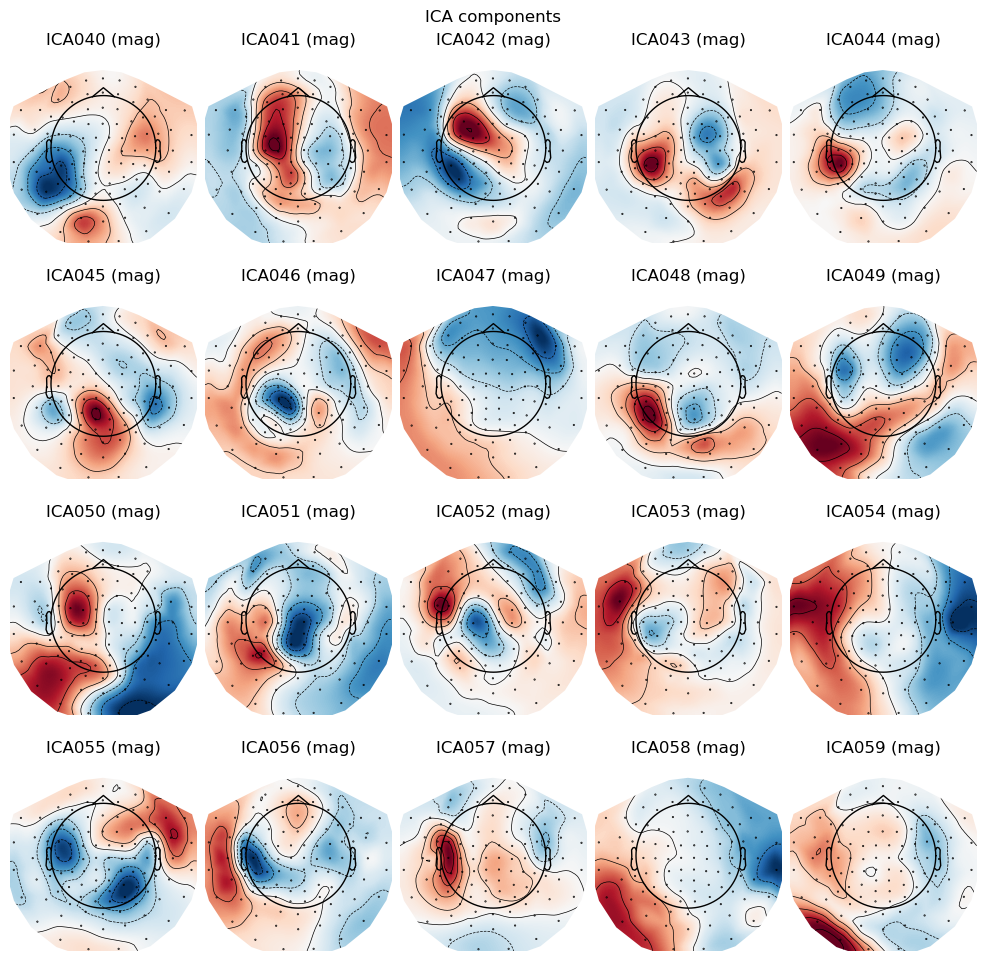

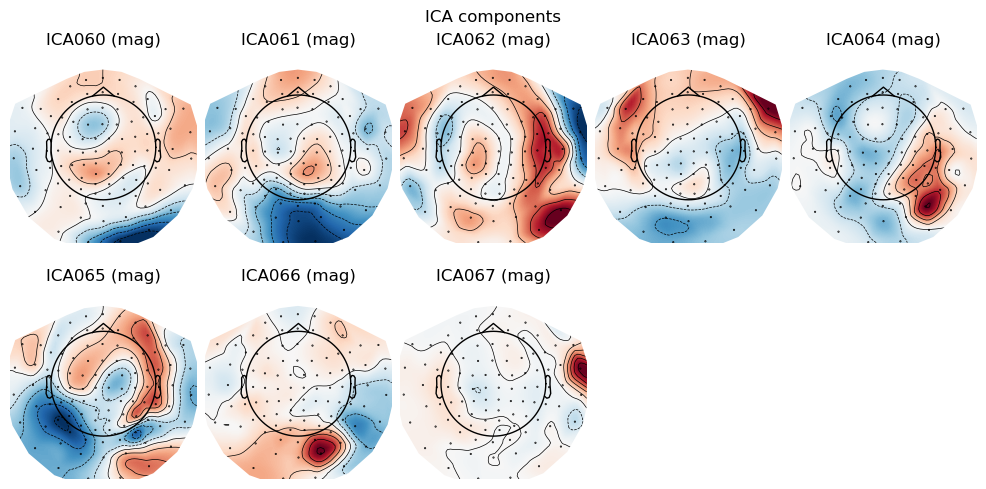

[<MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 975x496 with 8 Axes>]

In [10]:
ica.plot_sources(raw_sss, show_scrollbars=False)
ica.plot_components()

... filtering ICA sources
Setting up band-pass filter from 8 - 16 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 8.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 7.75 Hz)
- Upper passband edge: 16.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 16.25 Hz)
- Filter length: 2500 samples (10.000 s)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


... filtering target
Setting up band-pass filter from 8 - 16 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 8.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 7.75 Hz)
- Upper passband edge: 16.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 16.25 Hz)
- Filter length: 2500 samples (10.000 s)



[Parallel(n_jobs=1)]: Done  68 out of  68 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


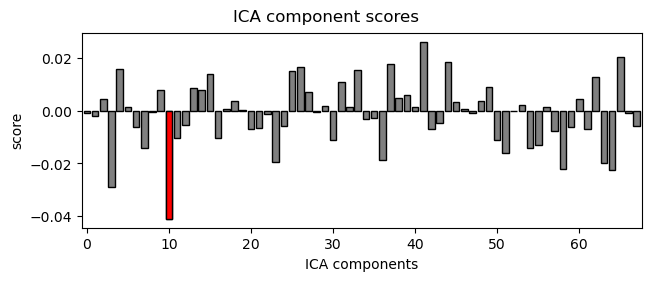

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
372 matching events found
No baseline correction applied
0 projection items activated


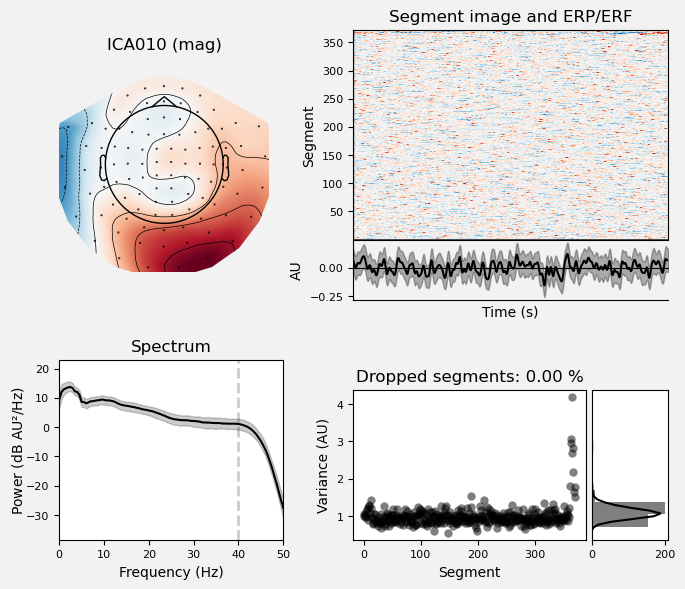

Creating RawArray with float64 data, n_channels=71, n_times=186000
    Range : 31000 ... 216999 =    124.000 ...   867.996 secs
Ready.


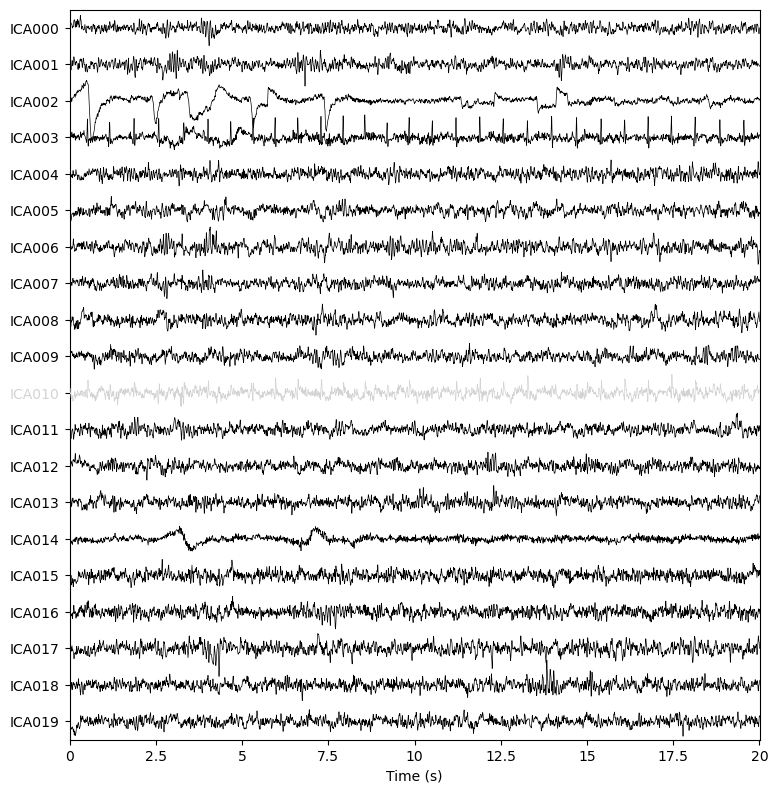

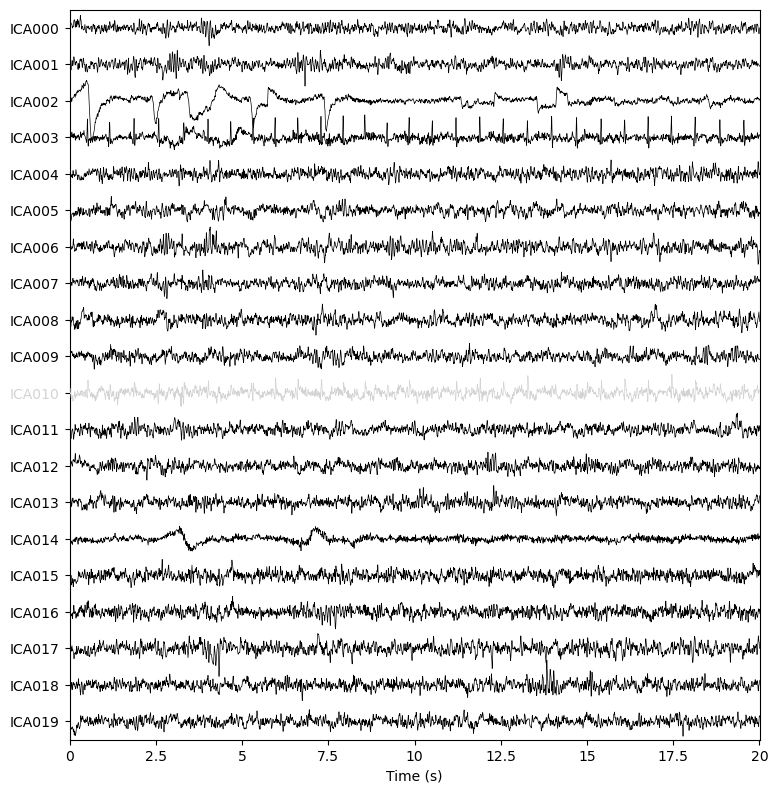

In [11]:
# Repairing ECG artifacts.

ica.exclude = []
# find which ICs match the ECG pattern
ecg_indices, ecg_scores = ica.find_bads_ecg(raw_sss, method="correlation", threshold="auto")
ica.exclude = ecg_indices

# barplot of ICA component "ECG match" scores
ica.plot_scores(ecg_scores)

# plot diagnostics
ica.plot_properties(raw_sss, picks=ecg_indices)

# plot ICs applied to raw data, with ECG matches highlighted
ica.plot_sources(raw_sss, show_scrollbars=False)

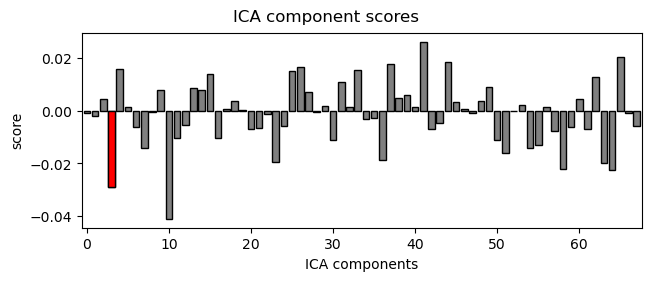

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
372 matching events found
No baseline correction applied
0 projection items activated


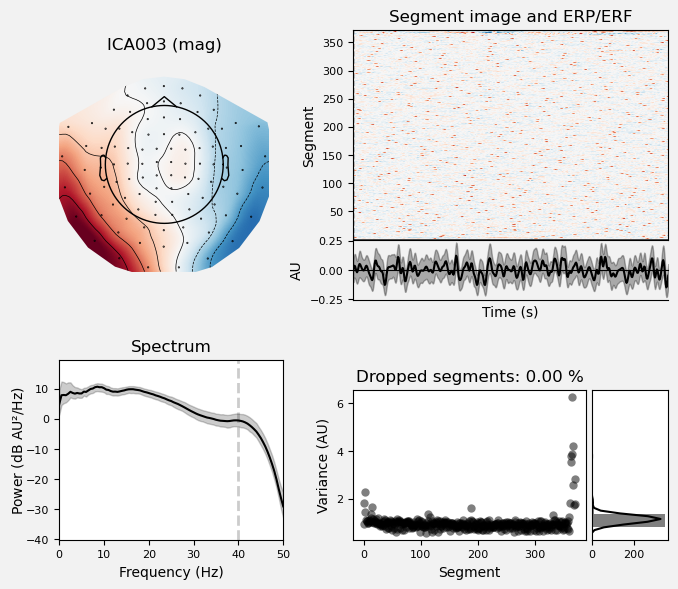

Creating RawArray with float64 data, n_channels=71, n_times=186000
    Range : 31000 ... 216999 =    124.000 ...   867.996 secs
Ready.


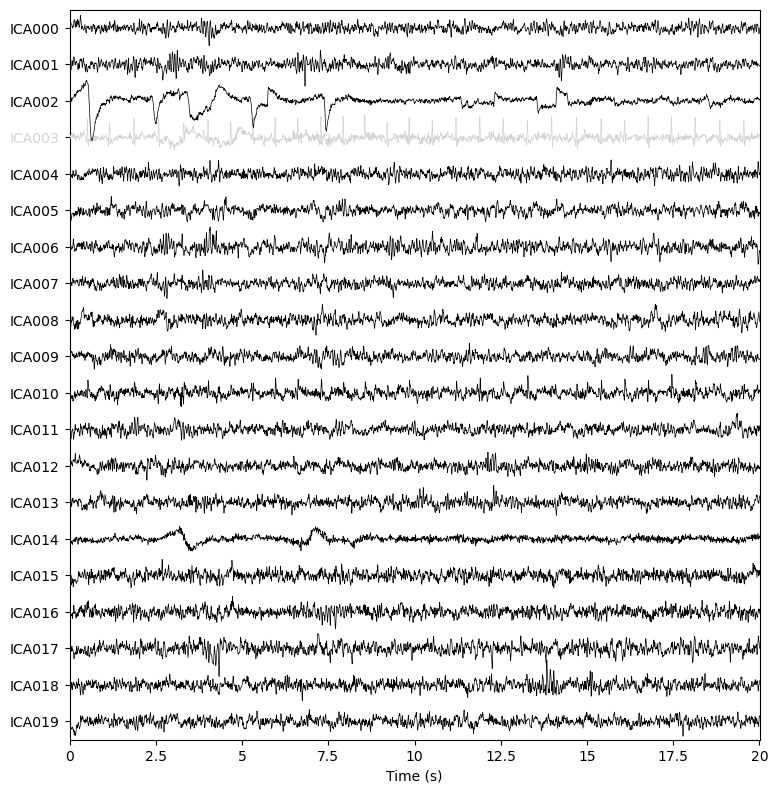

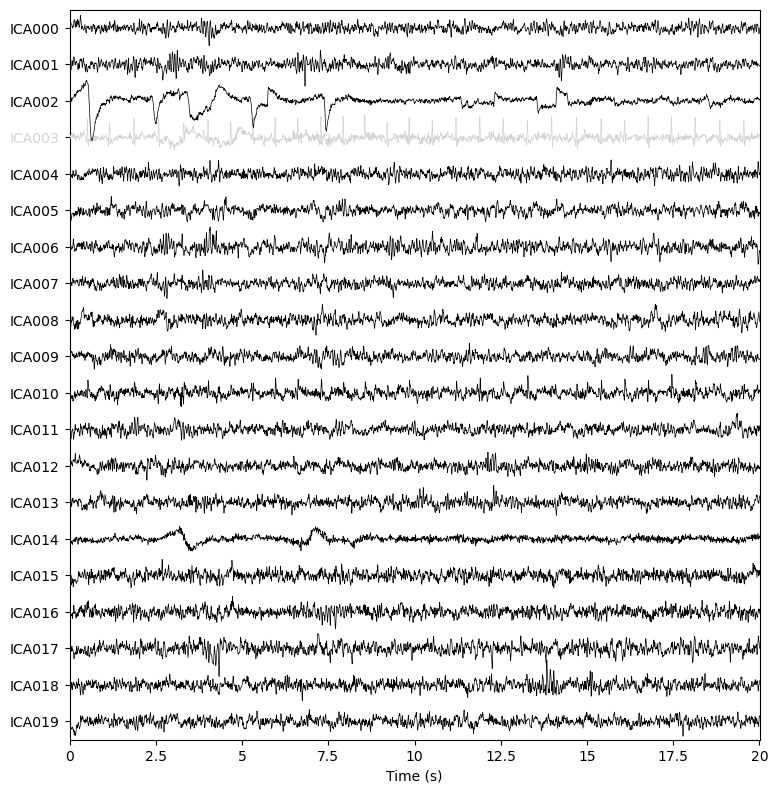

In [12]:
# Visual Inspection Change

## Heartbeat
ica.exclude.remove(10)

ica.exclude.append(3)

# barplot of ICA component "ECG match" scores
ica.plot_scores(ecg_scores)

# plot diagnostics
ica.plot_properties(raw_sss, picks=ecg_indices)

# plot ICs applied to raw data, with ECG matches highlighted
ica.plot_sources(raw_sss, show_scrollbars=False)

Using EOG channel: EOG002
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2500 samples (10.000 s)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2500 samples (10.000 s)



[Parallel(n_jobs=1)]: Done  68 out of  68 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


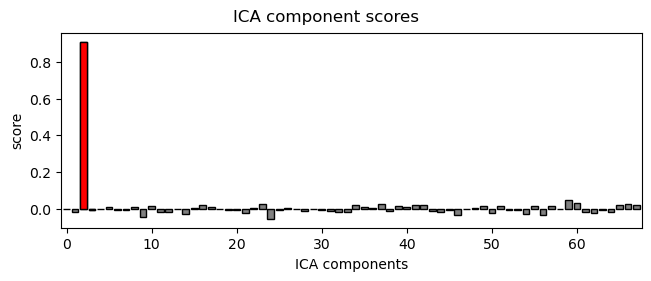

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
372 matching events found
No baseline correction applied
0 projection items activated


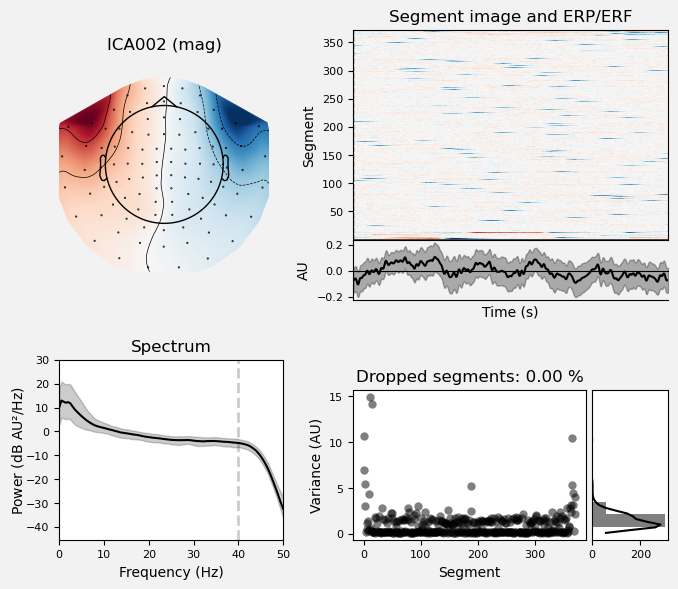

Creating RawArray with float64 data, n_channels=71, n_times=186000
    Range : 31000 ... 216999 =    124.000 ...   867.996 secs
Ready.


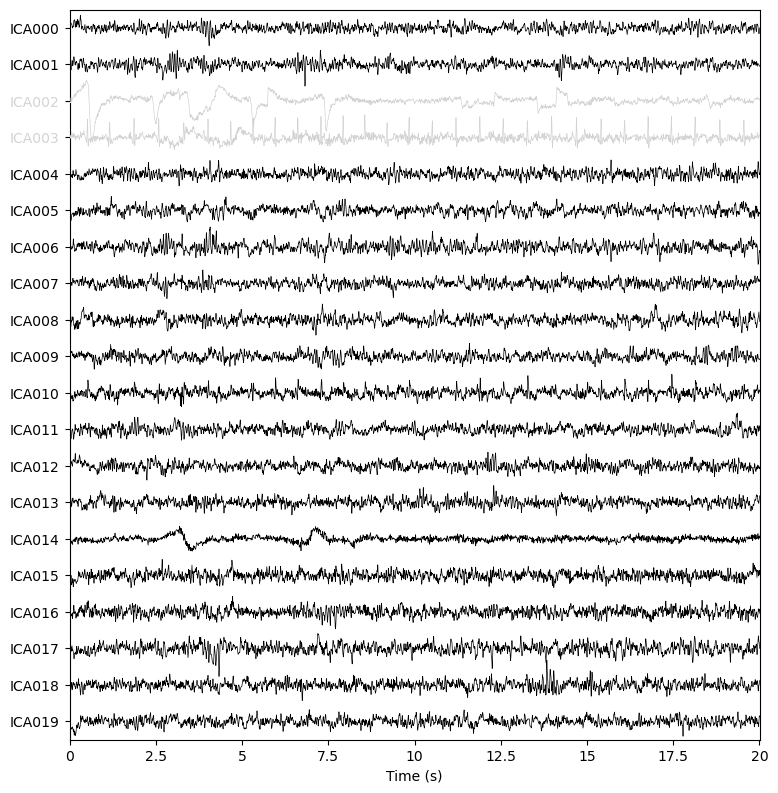

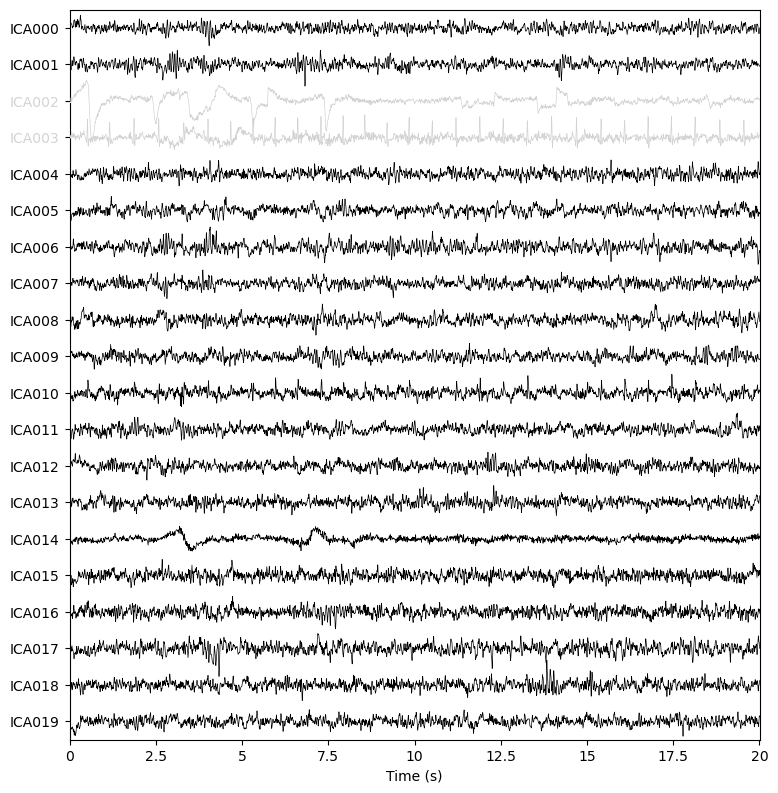

In [13]:
# find which ICs match the EOG pattern
eog_indices, eog_scores = ica.find_bads_eog(raw_sss, ch_name='EOG002', threshold="auto")
ica.exclude.extend(eog_indices)

# barplot of ICA component "ECG match" scores
ica.plot_scores(eog_scores)

# plot diagnostics
ica.plot_properties(raw_sss, picks=eog_indices)

# plot ICs applied to raw data, with ECG matches highlighted
ica.plot_sources(raw_sss, show_scrollbars=False)

Applying ICA to Raw instance
    Transforming to ICA space (68 components)
    Zeroing out 2 ICA components
    Projecting back using 306 PCA components


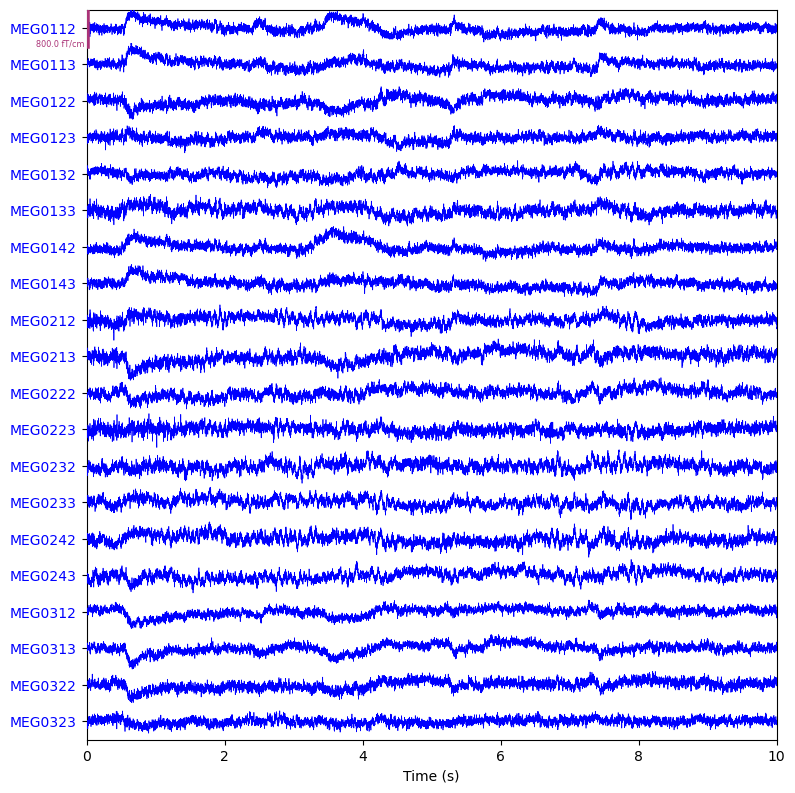

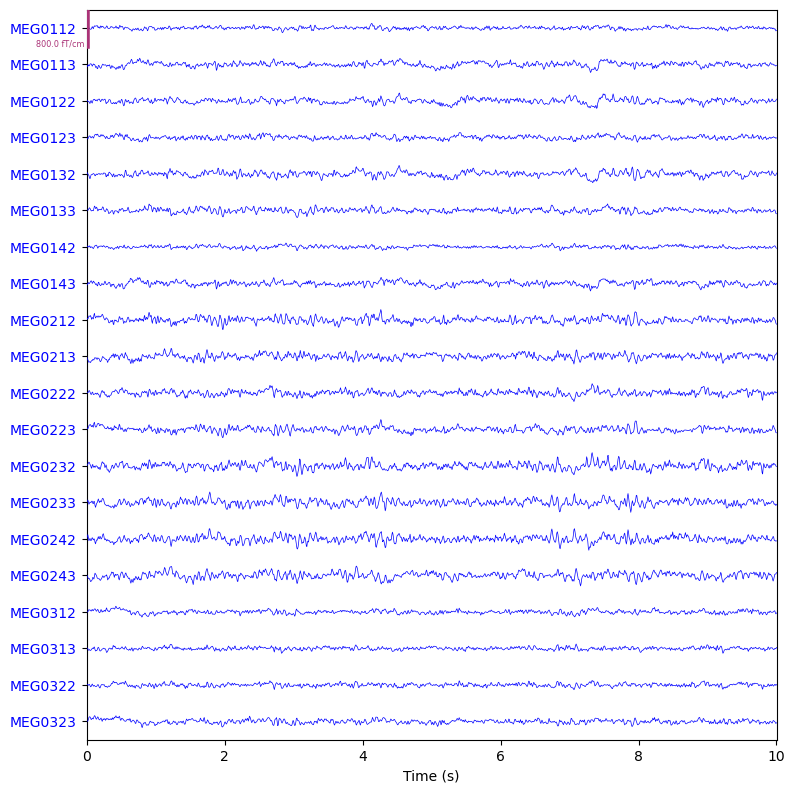

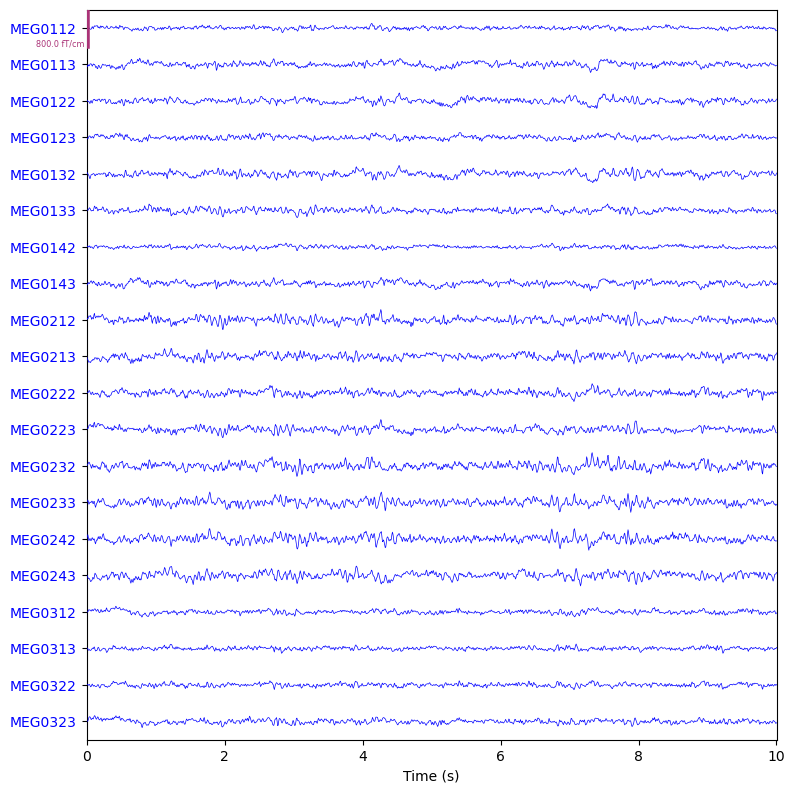

In [14]:
# Applying ICA 

reconst_raw = raw_sss.copy()
ica.apply(reconst_raw)

raw.plot(show_scrollbars=False)
reconst_raw.plot(show_scrollbars=False)


## Epoching Data

303 events found on stim channel STI101
Event IDs: [   1    2    4    8 4864 4865 4873]
Not setting metadata
303 matching events found
Setting baseline interval to [-0.5, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 303 events and 501 original time points ...
    Rejecting  epoch based on MAG : ['MEG2221']
    Rejecting  epoch based on MAG : ['MEG1641']
    Rejecting  epoch based on MAG : ['MEG0241']
    Rejecting  epoch based on MAG : ['MEG1611', 'MEG1621', 'MEG1631', 'MEG1811', 'MEG1821', 'MEG1841', 'MEG1911', 'MEG2021', 'MEG2211', 'MEG2221', 'MEG2231', 'MEG2311', 'MEG2411', 'MEG2441']
    Rejecting  epoch based on MAG : ['MEG1621', 'MEG1631', 'MEG1911', 'MEG2011']
    Rejecting  epoch based on MAG : ['MEG2211']
    Rejecting  epoch based on MAG : ['MEG0231', 'MEG0241', 'MEG1611', 'MEG1621']
    Rejecting  epoch based on MAG : ['MEG0221', 'MEG0411', 'MEG0421', 'MEG0431', 'MEG0441', 'MEG0631', 'MEG0711', 'MEG0721', 'ME

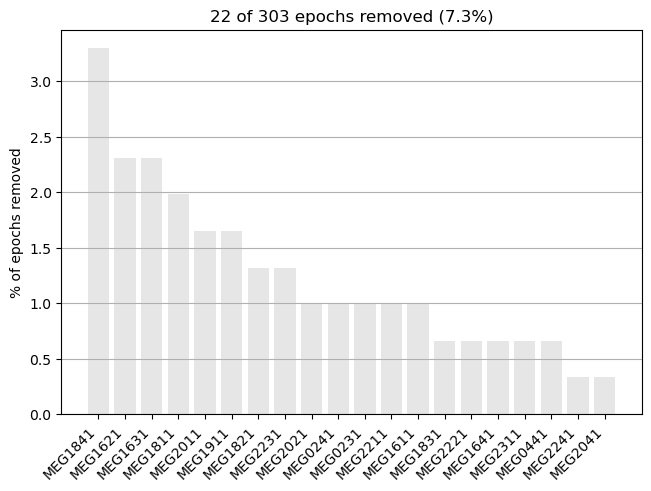

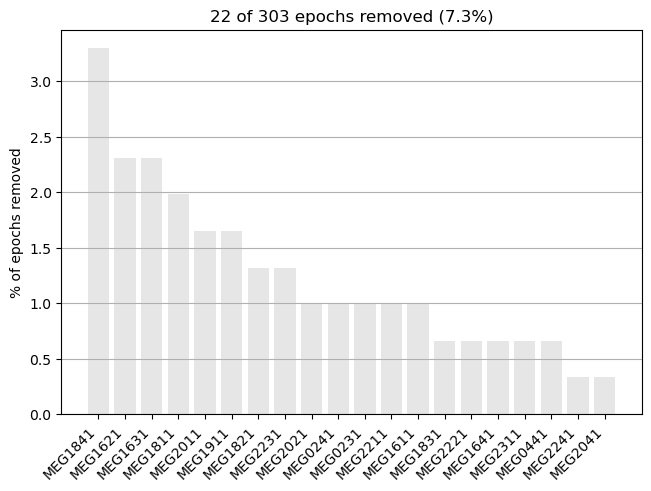

In [15]:
events = mne.find_events(reconst_raw, stim_channel="STI101", min_duration= 2 / reconst_raw.info['sfreq'])
np.save(derivatives_dir / f'{subject_id}_raw-events.npy', events)

event_dict = {
    "prepare": 1,
    "present": 2,
    "imagine": 4,
    "prepare_sentence": 8,
    "misc1": 4864,
    "misc2": 4865,
    "right_button_press": 4873,
}

reject_criteria = dict(
    grad=2000e-13,
    mag=2000e-15, 
)

flat_criteria = dict(grad=1e-13, mag=1e-15)

epochs = mne.Epochs(reconst_raw, 
                    events, 
                    tmin=-0.5, 
                    tmax=1.5, 
                    event_id=event_dict, 
                    preload=True,
                    reject_tmax=0,
                    reject=reject_criteria,
                    flat=flat_criteria,
                    reject_by_annotation=False,
)

epochs.plot_drop_log()

In [16]:
print(epochs)
print(epochs.event_id)

<Epochs |  281 events (all good), -0.5 – 1.5 s, baseline -0.5 – 0 s, ~354.3 MB, data loaded,
 'prepare': 93
 'present': 83
 'imagine': 95
 'prepare_sentence': 3
 'misc1': 3
 'misc2': 1
 'right_button_press': 3>
{'prepare': 1, 'present': 2, 'imagine': 4, 'prepare_sentence': 8, 'misc1': 4864, 'misc2': 4865, 'right_button_press': 4873}


You seem to have overlapping epochs. Some event lines may be duplicated in the plot.


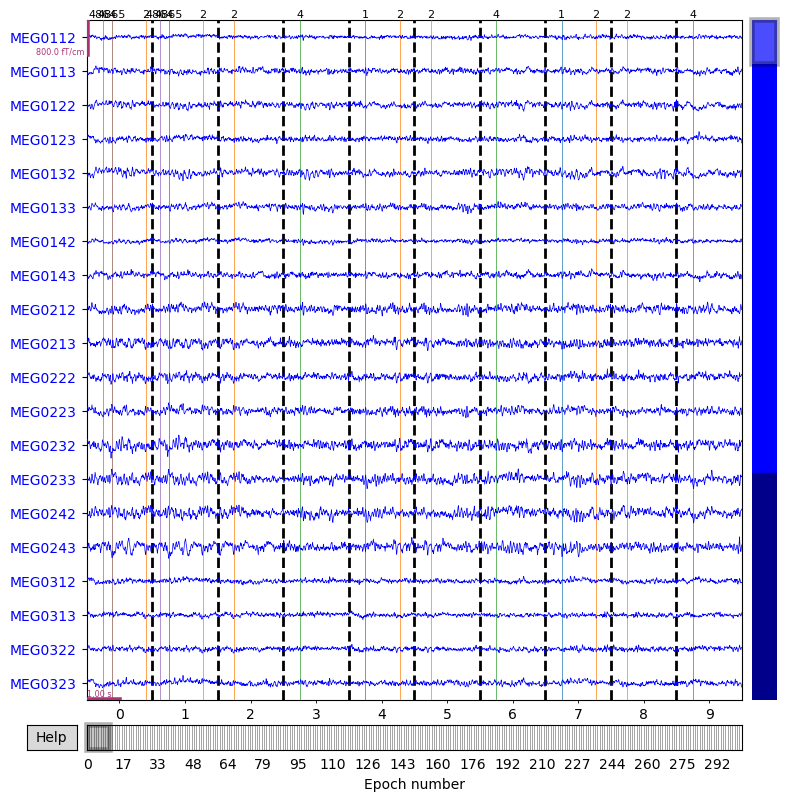

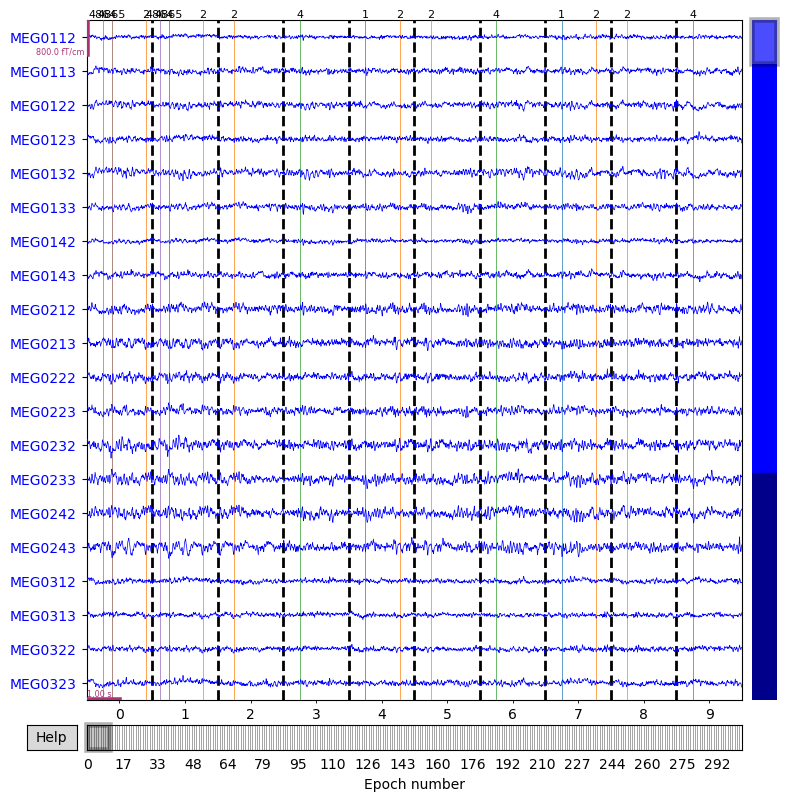

In [17]:
epochs.plot(n_epochs=10, events=True)

In [18]:
print(epochs["imagine"])

<Epochs |  95 events (all good), -0.5 – 1.5 s, baseline -0.5 – 0 s, ~123.2 MB, data loaded,
 'imagine': 95>


In [19]:
epochs.drop_bad()

In [20]:
evoked = epochs.average()

In [21]:
noise_cov = mne.compute_covariance(
    epochs, 
    tmin=-0.5, 
    tmax=0.0, 
    method='auto', 
    rank=None
)

    Setting small MEG eigenvalues to zero (without PCA)
Reducing data rank from 306 -> 68
Estimating covariance using SHRUNK
Done.
Estimating covariance using DIAGONAL_FIXED
    MAG regularization : 0.1
    GRAD regularization : 0.1
Done.
Estimating covariance using EMPIRICAL
Done.
Using cross-validation to select the best estimator.
    MAG regularization : 0.1
    GRAD regularization : 0.1
    MAG regularization : 0.1
    GRAD regularization : 0.1
    MAG regularization : 0.1
    GRAD regularization : 0.1
Number of samples used : 35406
log-likelihood on unseen data (descending order):
   shrunk: -399.885
   empirical: -399.888
   diagonal_fixed: -414.984
selecting best estimator: shrunk
[done]


## Saving Data

In [22]:
epochs_fname = derivatives_dir / f'{subject_id}_clean-epo.fif'
cov_fname = derivatives_dir / f'{subject_id}_baseline-cov.fif'
ica_fname = derivatives_dir / f'{subject_id}_fitted-ica.fif'

epochs.save(epochs_fname, overwrite=True)
mne.write_cov(cov_fname, noise_cov, overwrite=True)
ica.save(ica_fname, overwrite=True)

print(f"Successfully saved clean files to:\n  {derivatives_dir}")


Overwriting existing file.
Overwriting existing file.
Overwriting existing file.
Overwriting existing file.
Writing ICA solution to /rds/homes/t/txr124/parkh-speech-decode3/MSc_2025_26/Thomas_Roberts/speech_decoding/data/derivatives/preprocessing/sub-01/meg/sub-01_fitted-ica.fif...
Successfully saved clean files to:
  /rds/homes/t/txr124/parkh-speech-decode3/MSc_2025_26/Thomas_Roberts/speech_decoding/data/derivatives/preprocessing/sub-01/meg
